In [1]:
%load_ext autoreload
%autoreload 2
import project_utils
import pandas as pd
import numpy as np

import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print('Invalid device. Error.')
    pass

In [2]:
#load model and run vide
from tensorflow import keras
model = keras.models.load_model('../models/final/saves/best_model_val_735_test_670.h5')

ValueError: Unknown metric function: IOU_Metric

In [19]:
project_utils.play_images_from_directory('/home/jovyan/work/data/original/first_positive/', json_file='first_positive.json', num_to_iter=50)

In [7]:
directory_list = ['/home/jovyan/work/data/original/first_positive/',
                  '/home/jovyan/work/data/original/first_negative/',
                  '/home/jovyan/work/data/original/second_positive/',
                  '/home/jovyan/work/data/original/second_negative/', 
                  '/home/jovyan/work/data/original/third_positive/', 
                  '/home/jovyan/work/data/original/third_negative/', 
                  '/home/jovyan/work/data/original/first_positive/flipped/',
                  '/home/jovyan/work/data/original/first_negative/flipped/',
                  '/home/jovyan/work/data/original/second_positive/flipped/',
                  '/home/jovyan/work/data/original/second_negative/flipped/', 
                  '/home/jovyan/work/data/original/third_positive/flipped/', 
                  '/home/jovyan/work/data/original/third_negative/flipped/']

json_list = ['first_positive.json', 
             None, 
             'second_positive.json', 
             None, 
             'third_positive.json', 
             None, 
             'first_positive.json', 
             None, 
             'second_positive.json', 
             None, 
             'third_positive.json', 
             None]

# directory_list = ['/home/jovyan/work/data/original/third_negative/flipped/']
# json_list = [None]

num_augmented = 500

bounding_percentage = 0.01

project_utils.create_augmented_images(directory_list, json_list, '../data/debug/aug/', num_augmented, bounding_percentage)

images, confidence, annotations = project_utils.load_original_data('../data/debug/aug/', 'annotations.json')
display(project_utils.play_original_images(images[0:-1:10], confidence=confidence[0:-1:10], annotations=annotations[0:-1:10]))

Augmenting directory:  /home/jovyan/work/data/original/first_positive/
 Number augmented:  500
Augmenting directory:  /home/jovyan/work/data/original/first_negative/
 Number augmented:  0


In [4]:
#test load and play
images, confidence, annotations = project_utils.load_original_data('../data/original/first_positive/', 'first_positive.json')
project_utils.play_original_images(images[0:-1:20], confidence=confidence[0:-1:20], annotations=annotations[0:-1:20])

In [2]:
#test image flip
images, confidence, annotations = project_utils.load_original_data('../data/original/first_positive/', 'first_positive.json')
display(project_utils.play_original_images(images[0:-1:20], confidence=confidence[0:-1:20], annotations=annotations[0:-1:20]))
augmented_images, augmented_confidence, augmented_annotations = project_utils.get_flipped_images(images, confidence, annotations)
display(project_utils.play_original_images(augmented_images[0:-1:20], confidence=augmented_confidence[0:-1:20], annotations=augmented_annotations[0:-1:20]))

In [2]:
#test image augment
images, confidence, annotations = project_utils.load_original_data('../data/original/first_positive/', 'first_positive.json')
display('Num images: {}'.format(len(images)))
display(project_utils.play_original_images(images, confidence=confidence, annotations=annotations))
augmented_images, augmented_confidence, augmented_annotations = project_utils.get_augmented_images(images, confidence, annotations, 2000)
display('Num augmented images: {}'.format(len(augmented_images)))
display(project_utils.play_original_images(augmented_images, confidence=augmented_confidence, annotations=augmented_annotations))

'Num images: 786'

'Num augmented images: 2000'

In [18]:
#save images
images_positive, confidence_positive, annotations_positive = project_utils.load_original_data('../data/original/second_positive/', 'second_positive.json')
project_utils.save_augmented_images(images_positive, confidence_positive, annotations_positive, '../data/debug/positive/', 'second_positive.json')

Saving complete.


In [2]:
#test image augment
pd.set_option('display.max_colwidth', 500)
df = project_utils.load_image_dataframes('../data/original/first_positive/', 'first_positive.json')
df

,id,targets
0,0001.jpg,"[1.0, 152.05970149253733, 140.35820895522392, 397.05970149253733, 346.3582089552239]"
1,0002.jpg,"[1.0, 144.05970149253733, 140.35820895522392, 403.05970149253733, 345.3582089552239]"
2,0003.jpg,"[1.0, 142.05970149253733, 138.35820895522392, 402.05970149253733, 346.3582089552239]"
3,0004.jpg,"[1.0, 144.05970149253733, 140.35820895522392, 405.05970149253733, 344.3582089552239]"
4,0005.jpg,"[1.0, 141.05970149253733, 140.35820895522392, 407.05970149253733, 344.3582089552239]"
...,...,...
781,0782.jpg,"[1.0, 144.05970149253733, 132.35820895522392, 402.05970149253733, 341.3582089552239]"
782,0783.jpg,"[1.0, 131.05970149253733, 124.35820895522392, 405.05970149253733, 358.3582089552239]"
783,0784.jpg,"[1.0, 135.05970149253733, 131.35820895522392, 394.05970149253733, 335.3582089552239]"
784,0785.jpg,"[1.0, 150.05970149253733, 140.35820895522392, 403.05970149253733, 346.3582089552239]"


In [4]:
image_directory_list = ['../data/original/second_positive/', '../data/original/first_negative/']
json_list = ['second_positive.json', None]
copy_directory = '../data/debug/copy_test/'
project_utils.copy_image_directories(image_directory_list, json_list, copy_directory)

In [52]:
#test IOU metric
%load_ext autoreload
%autoreload 2
import project_utils
import pandas as pd
import numpy as np

import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print('Invalid device. Error.')
    pass

a = np.array([[1, 0, 0, 1, 1], [0, 0.5, 0.5, 1.5, 1.5], [0, 0, 0, 1, 1], [0, 0, 0, 1, 1]])
at = tf.convert_to_tensor(a, dtype=tf.float32)
b = np.array([[1, 0.5, 0.5, 1.5, 1.5], [1, 0, 0, 1, 1], [0, 0, 0, 1, 1], [0, 5, 5, 6, 6]])
bt = tf.convert_to_tensor(b, dtype=tf.float32)
c = project_utils.iou_metric(at, bt)
print(c)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
tf.Tensor([0.14285713 0.14285713 0.9999999  0.        ], shape=(4,), dtype=float32)


In [56]:
#test IOU metric
%load_ext autoreload
%autoreload 2
import project_utils_multi
import pandas as pd
import numpy as np

import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print('Invalid device. Error.')
    pass

a = np.array([[0, 0, 0, 0], [0, 0, 0, 0], [0, 0, 1, 1]])
at = tf.convert_to_tensor(a, dtype=tf.float32)
b = np.array([[0.5, 0.5, 1.5, 1.5], [0.5, 0.5, 1.5, 1.5], [0.5, 0.5, 1.5, 1.5]])
bt = tf.convert_to_tensor(b, dtype=tf.float32)
c = project_utils_multi.iou_metric_multi(at, bt)
print(c)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
tf.Tensor([0.         0.         0.14285713], shape=(3,), dtype=float32)


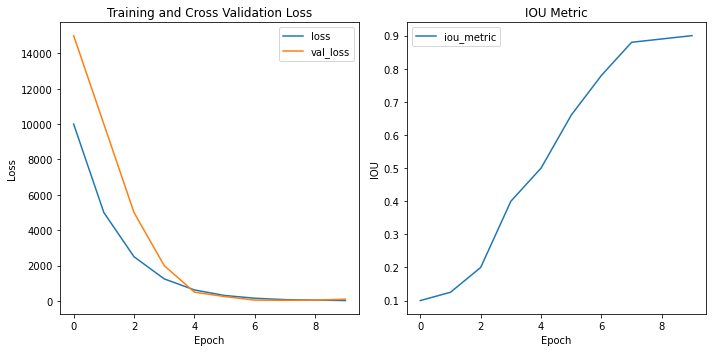

In [28]:
#test plot history
from types import SimpleNamespace

history_dict = { 'history' : {
        'loss' : [10000, 5000, 2500, 1250, 625, 312, 156, 78, 50, 25],
        'val_loss' : [15000, 10000, 5000, 2000, 500, 250, 50, 40, 50, 100],
        'iou_metric' : [0.1, 0.125, 0.2, 0.4, 0.5, 0.66, 0.78, 0.88, 0.89, 0.9]
    }
}
    
history = SimpleNamespace(**history_dict)

project_utils.plot_history(history)

In [15]:
#test playing images from data generator
from tensorflow import keras
from keras_preprocessing.image import ImageDataGenerator

df_test = project_utils.load_image_dataframes('../data/original/test_images/hand_only/positive/', 'positive.json')
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=df_test, 
    directory='../data/original/test_images/hand_only/positive/', 
    x_col='id', 
    y_col=['confidence', 'y1', 'x1', 'y2', 'x2'], 
    batch_size=32, 
    seed=0, 
    shuffle=True, 
    class_mode='raw', 
    target_size=(224, 224), 
    color_mode='rgb')

vgg = keras.applications.VGG19(weights='imagenet', include_top=False, input_tensor=keras.layers.Input(shape=(224, 224, 3)))
vgg.trainable = False
flatten = vgg.output
flatten = keras.layers.Flatten()(flatten)
bbHead = keras.layers.Dense(512, activation='relu')(flatten)
bbHead = keras.layers.Dropout(0.5)(bbHead)
bbHead = keras.layers.Dense(256, activation='relu')(bbHead)
bbHead = keras.layers.Dropout(0.5)(bbHead)
bbHead = keras.layers.Dense(128, activation='relu')(bbHead)
bbHead = keras.layers.Dropout(0.25)(bbHead)
bbHead = keras.layers.Dense(64, activation='relu')(bbHead)
bbHead = keras.layers.Dropout(0.25)(bbHead)
bbHead = keras.layers.Dense(5, activation='linear', name='bounding_output')(bbHead)
model = keras.models.Model(inputs=vgg.input, outputs=bbHead)
opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer=opt, metrics=[project_utils.iou_metric])
model.fit(test_generator, epochs=2)

project_utils.play_images_from_datagen(test_generator, model=model, scale_down=True, threshold=0.25, num_to_iter=10)

Found 43 validated image filenames.
Epoch 1/2
2/2 [==============================] - 1s 86ms/step - loss: 163526.3229 - iou_metric: 0.0000e+00
Epoch 2/2
2/2 [==============================] - 0s 258ms/step - loss: 150848.5104 - iou_metric: 0.0000e+00


In [4]:
#test playing images from data generator
from tensorflow import keras
from keras_preprocessing.image import ImageDataGenerator

df_test = project_utils.load_image_dataframes('../data/original/test_images/hand_only/positive/', 'positive.json')
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=df_test, 
    directory='../data/original/test_images/hand_only/positive/', 
    x_col='id', 
    y_col=['confidence', 'y1', 'x1', 'y2', 'x2'], 
    batch_size=32, 
    seed=0, 
    shuffle=True, 
    class_mode='raw', 
    target_size=(224, 224), 
    color_mode='rgb')

vgg = keras.applications.VGG19(weights='imagenet', include_top=False, input_tensor=keras.layers.Input(shape=(224, 224, 3)))
vgg.trainable = False
flatten = vgg.output
flatten = keras.layers.Flatten()(flatten)
bbHead = keras.layers.Dense(512, activation='relu')(flatten)
bbHead = keras.layers.Dropout(0.5)(bbHead)
bbHead = keras.layers.Dense(256, activation='relu')(bbHead)
bbHead = keras.layers.Dropout(0.5)(bbHead)
bbHead = keras.layers.Dense(128, activation='relu')(bbHead)
bbHead = keras.layers.Dropout(0.25)(bbHead)
bbHead = keras.layers.Dense(64, activation='relu')(bbHead)
bbHead = keras.layers.Dropout(0.25)(bbHead)
bbHead = keras.layers.Dense(5, activation='linear', name='bounding_output')(bbHead)
model = keras.models.Model(inputs=vgg.input, outputs=bbHead)
opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer=opt, metrics=[project_utils.iou_metric])
model.fit(test_generator, epochs=5)

project_utils.play_images_from_video('../data/original/test_videos/hand_signs_hand_only.mp4', model=model, threshold=0.25)

Found 43 validated image filenames.
Epoch 1/40
2/2 [==============================] - 1s 255ms/step - loss: 164987.3021 - iou_metric: 0.0000e+00
Epoch 2/40
2/2 [==============================] - 0s 85ms/step - loss: 157567.2500 - iou_metric: 0.0000e+00
Epoch 3/40
2/2 [==============================] - 0s 257ms/step - loss: 133707.8542 - iou_metric: 0.0000e+00
Epoch 4/40
2/2 [==============================] - 0s 251ms/step - loss: 103121.4089 - iou_metric: 1.6589e-04
Epoch 5/40
2/2 [==============================] - 0s 258ms/step - loss: 65248.3958 - iou_metric: 0.0213
Epoch 6/40
2/2 [==============================] - 0s 87ms/step - loss: 46741.5729 - iou_metric: 0.0506
Epoch 7/40
2/2 [==============================] - 0s 258ms/step - loss: 49952.3177 - iou_metric: 0.0768
Epoch 8/40
2/2 [==============================] - 0s 263ms/step - loss: 65276.3307 - iou_metric: 0.1235
Epoch 9/40
2/2 [==============================] - 0s 87ms/step - loss: 37212.1159 - iou_metric: 0.0922
Epoch 10/40

In [1]:
%load_ext autoreload
%autoreload 2
import project_utils_multi
import pandas as pd
import numpy as np

import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print('Invalid device. Error.')
    pass
#test playing images from data generator
from tensorflow import keras
from keras_preprocessing.image import ImageDataGenerator


df_test = project_utils_multi.load_image_dataframes('../data/original/test_images/hand_only/positive/', 'positive.json')
generator = project_utils_multi.DataGenerator(df_test, ['confidence', 'y1', 'x1', 'y2', 'x2'], directory='../data/original/test_images/hand_only/positive/', batch_size=10)
print('len: ', generator.get_length())

vgg = keras.applications.VGG19(weights='imagenet', include_top=False, input_tensor=keras.layers.Input(shape=(224, 224, 3)))
vgg.trainable = False
flatten = vgg.output
flatten = keras.layers.Flatten()(flatten)
hidden = keras.layers.Dense(1024, activation='relu')(flatten)
confHead = keras.layers.Dense(1, activation='sigmoid', name='confidence_output')(hidden)
bbHead = keras.layers.Dense(4, activation='linear', name='bounding_output')(hidden)

model = keras.models.Model(inputs=vgg.input, outputs=[confHead, bbHead])
opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer=opt, metrics=[[keras.metrics.BinaryAccuracy()], [project_utils_multi.iou_metric_multi]], run_eagerly=True)
model.fit(generator, epochs=1, steps_per_epoch=43 // 10)

# project_utils.play_images_from_sequence_datagen(generator, model=model, num_to_iter=10)

len:  43
tf.Tensor([0. 0. 0. 0. 0. 0. 0. 0. 0. 0.], shape=(10,), dtype=float32)
4/4 [==============================] - 18s 377ms/step - loss: 188207.6187 - confidence_output_loss: 0.3338 - bounding_output_loss: 188207.2875 - confidence_output_binary_accuracy: 0.3567 - bounding_output_iou_metric_multi: 0.0000e+00


In [4]:
%load_ext autoreload
%autoreload 2
import project_utils
import pandas as pd
import numpy as np

import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print('Invalid device. Error.')
    pass
#test playing images from data generator
from tensorflow import keras
from keras_preprocessing.image import ImageDataGenerator
df_test = project_utils.load_image_dataframes('../data/original/test_images/hand_only/positive/', 'positive.json')
df_test = df_test.head(40)
# display(df_test)
# gen = project_utils.DataGenerator(df_test, ['confidence', 'y1', 'x1', 'y2', 'x2'], directory='../data/original/test_images/hand_only/positive/')

train_dg, validation_dg = project_utils.create_data_generators(df_test, ['confidence', 'y1', 'x1', 'y2', 'x2'], directory='../data/original/test_images/hand_only/positive/', test_split=0.2, seed=0)

# display(train_dg.df)
# display(validation_dg.df)
print(train_dg.get_length())

image, conf, anno = train_dg.get_entry(0)

project_utils.play_images_from_sequence_datagen(train_dg, num_to_iter=4)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
32
0
4
8
12
16
20
24
28


In [4]:
%load_ext autoreload
%autoreload 2
import project_utils
import pandas as pd
import numpy as np

import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print('Invalid device. Error.')
    pass

display(project_utils.get_negative_positive_count('../data/original/first_positive/', 'first_positive.json'))
display(project_utils.get_negative_positive_count('../models/0001/data/train/', 'annotations.json'))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


{'negative': 0, 'positive': 786}

{'negative': 155, 'positive': 786}

In [1]:
%load_ext autoreload
%autoreload 2
import project_utils_multi
import pandas as pd
import numpy as np
import keras.backend as K

import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print('Invalid device. Error.')
    pass
#test playing images from data generator
from tensorflow import keras
from keras_preprocessing.image import ImageDataGenerator

class CustomCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        print("Start epoch {} of training".format(epoch))
    def on_epoch_end(self, epoch, logs=None):
        print("End epoch {} of training".format(epoch))
    def on_train_batch_begin(self, batch, logs=None):
        keys = list(logs.keys())
        print("...Training: start of batch {}".format(batch))
    def on_train_batch_end(self, batch, logs=None):
        print("\n...Training: end of batch {}".format(batch))


df = project_utils_multi.load_image_dataframes('../data/original/test_images/hand_only/positive/', 'positive.json')
generator = project_utils_multi.DataGenerator(df, ['confidence', 'y1', 'x1', 'y2', 'x2'], directory='../data/original/test_images/hand_only/positive/', batch_size=3)
df = df.drop([x for x in range(15, 43)])
# display(df)

class IOU_Metric(keras.metrics.Metric):
    def __init__(self, name='iou', **kwargs):
        super().__init__(**kwargs)
        self.iou_values = self.add_weight(name='iou_values', initializer='zeros', dtype=tf.float32)
        self.total = 0
        
    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true_area = K.abs(K.transpose(y_true)[2] - K.transpose(y_true)[0]) * K.abs(K.transpose(y_true)[3] - K.transpose(y_true)[1])
        y_pred_area = K.abs(K.transpose(y_pred)[2] - K.transpose(y_pred)[0]) * K.abs(K.transpose(y_pred)[3] - K.transpose(y_pred)[1])

        x1 = K.maximum(K.transpose(y_true)[1], K.transpose(y_pred)[1])
        y1 = K.maximum(K.transpose(y_true)[0], K.transpose(y_pred)[0])
        x2 = K.minimum(K.transpose(y_true)[3], K.transpose(y_pred)[3])
        y2 = K.minimum(K.transpose(y_true)[2], K.transpose(y_pred)[2])

        intersection = K.maximum(0.0, x2 - x1) * K.maximum(0.0, y2 - y1)
        union = y_true_area + y_pred_area - intersection
        iou = intersection / (union + K.epsilon())
        iou = K.clip(iou, 0, 1.0)
        self.iou_values.assign_add(K.sum(iou))
        self.total += K.get_value(K.sum(K.cast(K.cast(iou, dtype=tf.bool), dtype=tf.uint8)))
        
    def reset_states(self):
        super().reset_states()
        self.total = 0
        
    def result(self):
        if self.total == 0:
            return 0
        result = self.iou_values / self.total
        return result

vgg = keras.applications.VGG19(weights='imagenet', include_top=False, input_tensor=keras.layers.Input(shape=(224, 224, 3)))
vgg.trainable = False
flatten = vgg.output
flatten = keras.layers.Flatten()(flatten)
hidden = keras.layers.Dense(1024, activation='relu')(flatten)
confHead = keras.layers.Dense(1, activation='sigmoid', name='confidence_output')(hidden)
bbHead = keras.layers.Dense(4, activation='linear', name='bounding_output')(hidden)

model = keras.models.Model(inputs=vgg.input, outputs=[confHead, bbHead])
opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer=opt, metrics=[[], [IOU_Metric(), project_utils_multi.iou_metric_multi]], run_eagerly=True)
history = model.fit(generator, epochs=4, steps_per_epoch=15 // 3)#, callbacks=[CustomCallback()])
# history = model.fit(generator, epochs=2, steps_per_epoch=10 // 2)#, callbacks=[CustomCallback()])
display(history.history)
print(model.evaluate(generator))

Epoch 1/4
5/5 [==============================] - 14s 158ms/step - loss: 168598.4115 - confidence_output_loss: 0.2850 - bounding_output_loss: 168598.1380 - bounding_output_iou__metric: 0.0000e+00 - bounding_output_iou_metric_multi: 0.0000e+00
Epoch 2/4
5/5 [==============================] - 1s 158ms/step - loss: 98688.1641 - confidence_output_loss: 0.0000e+00 - bounding_output_loss: 98688.1641 - bounding_output_iou__metric: 0.0275 - bounding_output_iou_metric_multi: 0.0035
Epoch 3/4
5/5 [==============================] - 1s 160ms/step - loss: 16632.8802 - confidence_output_loss: 0.0000e+00 - bounding_output_loss: 16632.8802 - bounding_output_iou__metric: 0.1559 - bounding_output_iou_metric_multi: 0.1397
Epoch 4/4
5/5 [==============================] - 1s 158ms/step - loss: 21316.1226 - confidence_output_loss: 0.0000e+00 - bounding_output_loss: 21316.1226 - bounding_output_iou__metric: 0.2207 - bounding_output_iou_metric_multi: 0.2207


{'loss': [158028.796875, 82220.5546875, 17879.4296875, 24195.908203125],
 'confidence_output_loss': [0.16760273277759552, 0.0, 0.0, 0.0],
 'bounding_output_loss': [158028.640625,
  82220.5546875,
  17879.4296875,
  24195.908203125],
 'bounding_output_iou__metric': [0,
  0.07068917900323868,
  0.17011727392673492,
  0.17116482555866241],
 'bounding_output_iou_metric_multi': [0.0,
  0.009425223805010319,
  0.14743496477603912,
  0.17116482555866241]}

14/14 [==============================] - 1s 64ms/step - loss: 22446.8184 - confidence_output_loss: 0.0000e+00 - bounding_output_loss: 22446.8184 - bounding_output_iou__metric: 0.1993 - bounding_output_iou_metric_multi: 0.1993
[22446.818359375, 0.0, 22446.818359375, 0.1992722451686859, 0.1992722451686859]


In [10]:
from misc import project_utils_multi
import tensorflow as tf
import keras
import numpy as np
import keras.backend as K

class IOU_Metric(keras.metrics.Metric):
    def __init__(self, name='iou', **kwargs):
        super().__init__(**kwargs)
        self.iou_values = self.add_weight(name='iou_values', initializer='zeros', dtype=tf.float32)
        self.total = 0
        
    def update_state(self, y_true, y_pred, sample_weight=None):
        y_true_area = K.abs(K.transpose(y_true)[2] - K.transpose(y_true)[0]) * K.abs(K.transpose(y_true)[3] - K.transpose(y_true)[1])
        y_pred_area = K.abs(K.transpose(y_pred)[2] - K.transpose(y_pred)[0]) * K.abs(K.transpose(y_pred)[3] - K.transpose(y_pred)[1])

        x1 = K.maximum(K.transpose(y_true)[1], K.transpose(y_pred)[1])
        y1 = K.maximum(K.transpose(y_true)[0], K.transpose(y_pred)[0])
        x2 = K.minimum(K.transpose(y_true)[3], K.transpose(y_pred)[3])
        y2 = K.minimum(K.transpose(y_true)[2], K.transpose(y_pred)[2])

        intersection = K.maximum(0.0, x2 - x1) * K.maximum(0.0, y2 - y1)
        union = y_true_area + y_pred_area - intersection
        iou = intersection / (union + K.epsilon())
        iou = K.clip(iou, 0, 1.0)
        self.iou_values.assign_add(K.sum(iou))
        self.total += K.get_value(K.sum(K.cast(K.cast(iou, dtype=tf.bool), dtype=tf.uint8)))
        
    def reset_states(self):
        super().reset_states()
        self.total = 0
        
    def result(self):
        result = self.iou_values / self.total
        return result

a1 = np.array([[0, 0, 1, 1],])
at1 = tf.convert_to_tensor(a1, dtype=tf.float32)

b1 = np.array([[0, 0, 3, 3],])
bt1 = tf.convert_to_tensor(b1, dtype=tf.float32)

# c1 = project_utils_multi.iou_metric_multi(at1, bt1)
# print(c1)
# c2 = project_utils_multi.iou_metric_multi(at2, bt2)
# print(c2)

metric = IOU_Metric()

print(at1)
print(bt1)
metric.update_state(at1, bt1)
print(metric.result())

# metric.update_state(at2, bt2)
# print(metric.result())
# metric.reset_states()
# print(metric.result())

tf.Tensor([[0. 0. 1. 1.]], shape=(1, 4), dtype=float32)
tf.Tensor([[0. 0. 3. 3.]], shape=(1, 4), dtype=float32)
tf.Tensor(0.11111111, shape=(), dtype=float32)
